In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA


# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

In [3]:
df = pd.read_csv("Marketing_data.csv")

In [5]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [6]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [6]:
# check the one off purchase of 40k

df[df["ONEOFF_PURCHASES"] == 40761.25]


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
550,C10574,11547.52001,1.0,49039.57,40761.25,8278.32,558.166886,1.0,1.0,0.916667,0.083333,1,101,22500.0,46930.59824,2974.069421,0.25,12


In [7]:
df["CASH_ADVANCE"].max()

47137.211760000006

In [8]:
# check the cash advance of 47k

df[df["CASH_ADVANCE"] == 47137.211760000006]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
2159,C12226,10905.05381,1.0,431.93,133.5,298.43,47137.21176,0.583333,0.25,0.5,1.0,123,21,19600.0,39048.59762,5394.173671,0.0,12


#### Preprocessing

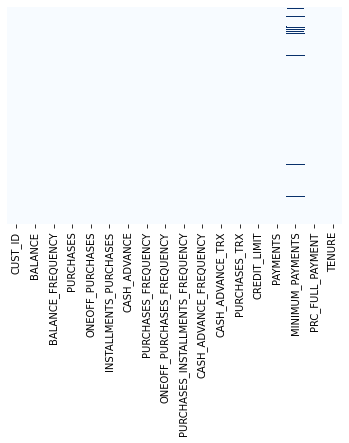

In [9]:
# check for missing data 
sns.heatmap(df.isnull(), yticklabels = False, cbar = False, cmap = "Blues")

In [10]:
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [11]:
# replace missing values with mean
min_payments_mean = df["MINIMUM_PAYMENTS"].mean()
CREDIT_LIMIT_mean = df["CREDIT_LIMIT"].mean()

In [12]:
min_payments_mean

864.2065423050814

In [13]:
df.loc[(df.MINIMUM_PAYMENTS.isnull() == True), "MINIMUM_PAYMENTS"] = min_payments_mean

In [14]:
df.loc[(df.CREDIT_LIMIT.isnull() == True), "CREDIT_LIMIT"] = CREDIT_LIMIT_mean

In [15]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.612411,2895.063757,2330.588021,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,170.857654,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,335.628312,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,864.206542,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [16]:
df.isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [17]:
# check for duplicated
df.duplicated().sum()

0

In [18]:
# drop customer ID
df.drop(["CUST_ID"], axis = 1, inplace = True)

In [19]:
n =  len(df.columns)
n

17

In [20]:
df.columns

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'],
      dtype='object')

C:\Users\luca.manfredi\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


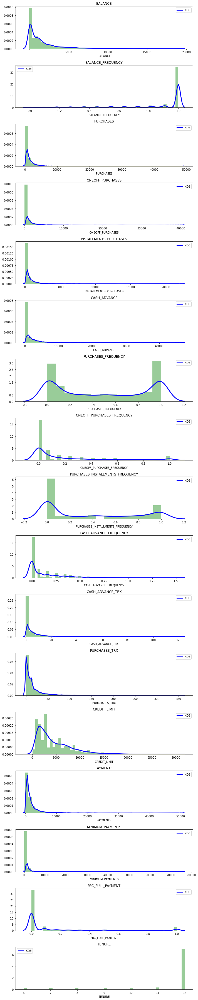

In [21]:
# Plot features

plt.figure(figsize = (10,50))

for i in range(len(df.columns)):
    plt.subplot(17, 1,  i+1) 
    sns.distplot(df[df.columns[i]], kde_kws = {"color": "b", "lw": 3, "label": "KDE"}, hist_kws= {"color":"g"}) # plot hist and kde
    
    plt.title(df.columns[i])     
    
plt.tight_layout()



#### Find optimal number of K

In [23]:
# scale data
sc = StandardScaler()
df_sc = sc.fit_transform(df) 

In [24]:
df_sc

array([[-0.73198937, -0.24943448, -0.42489974, ..., -0.31096755,
        -0.52555097,  0.36067954],
       [ 0.78696085,  0.13432467, -0.46955188, ...,  0.08931021,
         0.2342269 ,  0.36067954],
       [ 0.44713513,  0.51808382, -0.10766823, ..., -0.10166318,
        -0.52555097,  0.36067954],
       ...,
       [-0.7403981 , -0.18547673, -0.40196519, ..., -0.33546549,
         0.32919999, -4.12276757],
       [-0.74517423, -0.18547673, -0.46955188, ..., -0.34690648,
         0.32919999, -4.12276757],
       [-0.57257511, -0.88903307,  0.04214581, ..., -0.33294642,
        -0.52555097, -4.12276757]])

In [25]:
# Elbow Plot 
score_1 = []
range_values = range(1,20)

for i in range_values:
    kmeans = KMeans(n_clusters = i)
    kmeans.fit(df_sc)
    score_1.append(kmeans.inertia_) # inertia is the WCSS
    

In [26]:
score_1

[152149.9999999988,
 127785.24928638579,
 111986.42473458065,
 99073.93826774784,
 91501.72292789817,
 84852.57455729539,
 79528.18405555369,
 74495.73129660638,
 69979.19145324353,
 67563.72565691778,
 63645.440922438596,
 61357.23882688432,
 59170.90530117205,
 57459.69278235868,
 55915.124606290614,
 54535.96056245096,
 53313.18143931827,
 51761.25733903048,
 50823.42632475625]

<function matplotlib.pyplot.show(*args, **kw)>

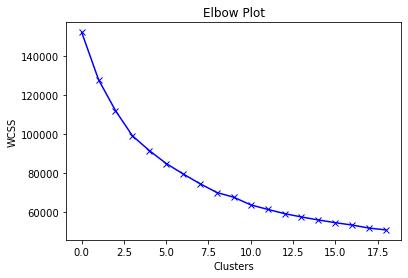

In [28]:
plt.plot(score_1, "bx-")
plt.title("Elbow Plot")
plt.xlabel("Clusters")
plt.ylabel("WCSS")
plt.show

We pick K = 7 because after then it starts saturate

In [29]:
# Apply KMeans with K = 8
kmeans = KMeans(n_clusters = 8)
kmeans.fit(df_sc)
labels = kmeans.labels_

In [30]:
labels.shape

(8950,)

In [31]:
kmeans.cluster_centers_ 
# ndarray of shape (n_clusters, n_features) - Coordinates of cluster centers. 

array([[-7.01367765e-01, -2.14507232e+00, -3.12447030e-01,
        -2.37525786e-01, -3.02284566e-01, -3.21781866e-01,
        -5.56726546e-01, -4.45738307e-01, -4.39324943e-01,
        -5.20712703e-01, -3.76017728e-01, -4.19882936e-01,
        -1.77196361e-01, -2.03413692e-01, -2.56627028e-01,
         2.80785105e-01,  1.99062494e-01],
       [-3.66638840e-01,  3.33154645e-01, -3.82427016e-02,
        -2.44204654e-01,  3.58036099e-01, -3.63597786e-01,
         9.91214051e-01, -3.86909171e-01,  1.20635521e+00,
        -4.75154369e-01, -3.61158260e-01,  1.87123161e-01,
        -2.60825362e-01, -2.17615819e-01, -4.57749738e-02,
         3.15794445e-01,  2.57381161e-01],
       [ 1.92305052e+00,  3.37716867e-01,  1.12120418e+01,
         1.06003671e+01,  7.03311838e+00,  4.19625127e-01,
         1.04698328e+00,  1.91550149e+00,  9.81333653e-01,
        -2.58911831e-01,  6.12285458e-02,  5.36243850e+00,
         3.04406408e+00,  8.09897492e+00,  1.12031761e+00,
         1.11013157e+00,  3.1

In [32]:
kmeans.cluster_centers_.shape

(8, 17)

In [33]:
cluster_centers = pd.DataFrame(data = kmeans.cluster_centers_, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.701368,-2.145072,-0.312447,-0.237526,-0.302285,-0.321782,-0.556727,-0.445738,-0.439325,-0.520713,-0.376018,-0.419883,-0.177196,-0.203414,-0.256627,0.280785,0.199062
1,-0.366639,0.333155,-0.038243,-0.244205,0.358036,-0.363598,0.991214,-0.386909,1.206355,-0.475154,-0.361158,0.187123,-0.260825,-0.217616,-0.045775,0.315794,0.257381
2,1.923051,0.337717,11.212042,10.600367,7.033118,0.419625,1.046983,1.915501,0.981334,-0.258912,0.061229,5.362438,3.044064,8.098975,1.120318,1.110132,0.310863
3,0.017800,0.403887,-0.361919,-0.247244,-0.401409,-0.090679,-0.865969,-0.409885,-0.757514,0.110640,-0.023694,-0.486632,-0.305986,-0.249774,-0.004003,-0.457071,0.272769
4,-0.163412,0.391134,0.472299,0.617069,-0.017068,-0.332985,0.943040,1.879085,0.088716,-0.407181,-0.323048,0.531446,0.382952,0.100227,-0.162514,0.414810,0.262127
5,1.688970,0.391723,-0.218574,-0.156776,-0.228858,2.027093,-0.479492,-0.213637,-0.416123,1.926747,1.940416,-0.267524,1.029334,0.824331,0.512168,-0.390749,0.069221
6,-0.336050,-0.347078,-0.289267,-0.215966,-0.286835,0.068284,-0.203078,-0.288661,-0.224549,0.308663,0.000996,-0.388117,-0.567159,-0.392680,-0.209145,0.014011,-3.203733
7,0.932292,0.467172,2.252464,1.708207,2.187676,-0.193361,1.160017,1.546775,1.256533,-0.310951,-0.209353,2.795546,1.232365,1.282830,0.574039,0.272222,0.333800


In [34]:
# Inverse transformation
cluster_centers = sc.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data = cluster_centers, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,104.637027,0.369123,335.656938,198.193215,137.715462,304.079507,0.266909,0.069485,0.189838,0.030944,0.682782,4.273113,3849.736594,1144.281146,266.148080,0.235839,11.783715
1,801.347031,0.956192,921.498712,187.107663,734.835246,216.389570,0.888173,0.087035,0.843874,0.040061,0.784187,19.361014,3545.460071,1103.167378,757.529897,0.246079,11.861760
2,5567.142164,0.957273,24957.905000,18186.875667,6771.029333,1858.844605,0.910556,0.773889,0.754444,0.083333,3.666667,148.000000,15570.000000,25178.882690,3475.059479,0.478409,11.933333
3,1601.523520,0.972948,229.959290,182.062437,48.078794,788.712588,0.142795,0.080181,0.063382,0.157284,3.087132,2.613971,3381.145833,1010.071571,854.876864,0.020029,11.882353
4,1224.347510,0.969927,2012.278130,1616.645158,395.632972,280.586143,0.868838,0.763025,0.399695,0.053663,1.044264,27.919603,5887.784348,2023.292491,485.475092,0.275040,11.868112
5,5079.922977,0.970066,536.217106,332.220995,204.113785,5229.779385,0.297907,0.138726,0.199059,0.520706,16.490741,8.060185,8239.588594,4119.502683,2057.792150,0.039427,11.609954
6,865.015978,0.795051,385.181720,233.977974,151.686061,1122.064941,0.408846,0.116344,0.275196,0.196911,3.255627,5.062701,2430.891398,596.373827,376.802926,0.157813,7.229904
7,3504.962706,0.987939,5815.628058,3427.711343,2389.355564,573.383862,0.955921,0.663891,0.863816,0.072920,1.820144,84.196643,8978.297362,5446.809658,2201.980160,0.233335,11.964029


In [35]:
labels.shape

(8950,)

In [36]:
print(labels.min())
print(labels.max()) 

0
7


In [37]:
# concat labels to original df to create a supervised df with a target variable
df_cl = pd.concat([df, pd.DataFrame({"Cluster":labels})], axis = 1)
df_cl

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.000000,201.802084,139.509787,0.000000,12,3
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.000000,4103.032597,1072.340217,0.222222,12,5
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.000000,622.066742,627.284787,0.000000,12,4
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.000000,0.000000,864.206542,0.000000,12,3
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.000000,678.334763,244.791237,0.000000,12,3
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.000000,1400.057770,2407.246035,0.000000,12,1
6,627.260806,1.000000,7091.01,6402.63,688.38,0.000000,1.000000,1.000000,1.000000,0.000000,0,64,13500.000000,6354.314328,198.065894,1.000000,12,7
7,1823.652743,1.000000,436.20,0.00,436.20,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,2300.000000,679.065082,532.033990,0.000000,12,1
8,1014.926473,1.000000,861.49,661.49,200.00,0.000000,0.333333,0.083333,0.250000,0.000000,0,5,7000.000000,688.278568,311.963409,0.000000,12,3
9,152.225975,0.545455,1281.60,1281.60,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,3,11000.000000,1164.770591,100.302262,0.000000,12,0


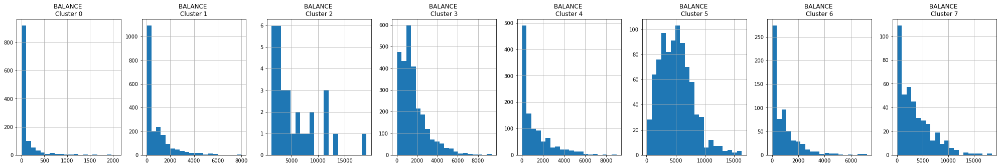

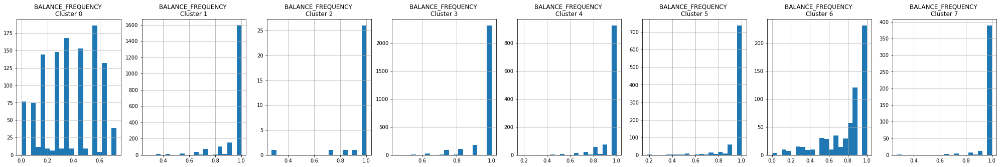

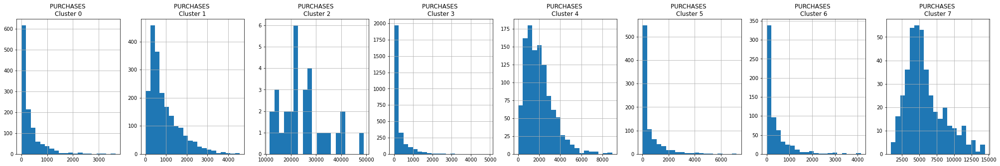

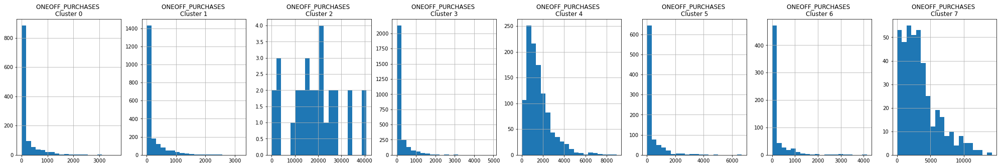

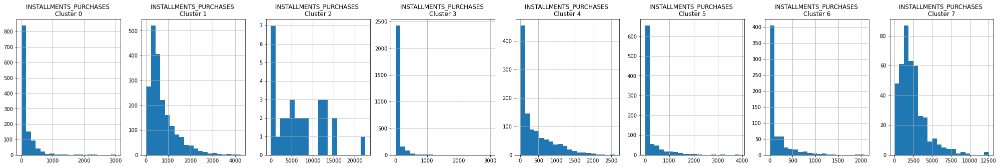

...

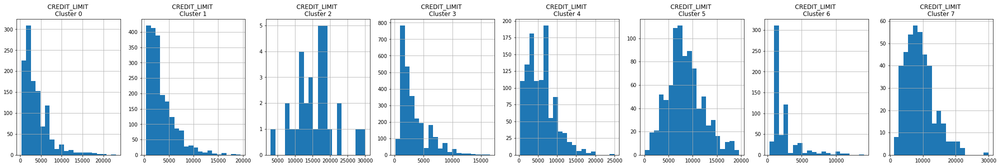

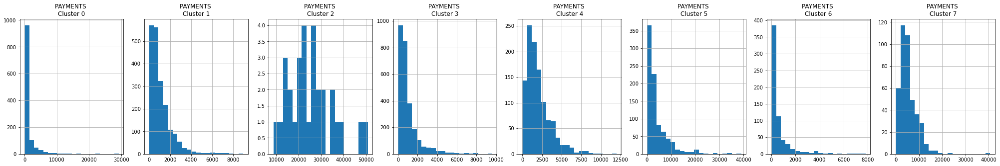

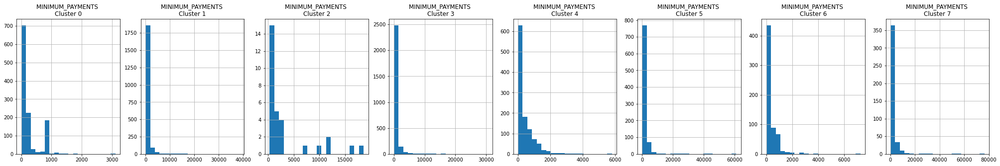

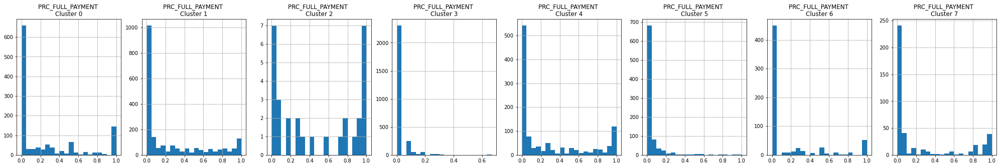

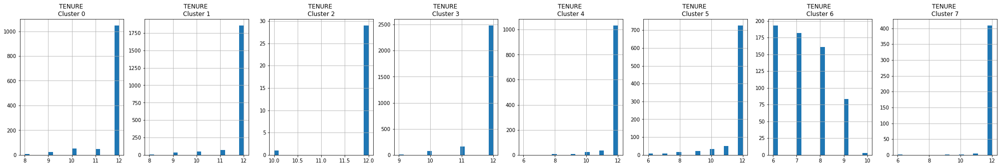

In [38]:
# plot histograms for each cluster
for i in df.columns:
    plt.figure(figsize = (35, 5))
    for j in range (8):
        plt.subplot(1,8, j+1)
        cluster = df_cl[df_cl["Cluster"] == j]
        cluster[i].hist(bins = 20)
        plt.title("{} \nCluster {}".format(i,j))
        
    plt.show()

#### PCA for Demensionality Reduction

In [39]:
# PCA to visualize clusters after reducing features

pca = PCA(n_components=2) # takes all the features and compresses them into 2 features 
principal_comp = pca.fit_transform(df_sc)

In [40]:
principal_comp 

array([[-1.68221853, -1.07644074],
       [-1.13828862,  2.50652039],
       [ 0.96967208, -0.38359621],
       ...,
       [-0.92620339, -1.81078747],
       [-2.33654741, -0.65794143],
       [-0.55642683, -0.40049374]])

In [41]:
# df with 2 components
pca_df = pd.DataFrame(data = principal_comp, columns = ["pca1", "pca2"])
pca_df.head()

,pca1,pca2
0,-1.682219,-1.076441
1,-1.138289,2.506520
2,0.969672,-0.383596
3,-0.873625,0.043184
4,-1.599432,-0.688573


In [42]:
pca_df

,pca1,pca2
0,-1.682219,-1.076441
1,-1.138289,2.506520
2,0.969672,-0.383596
3,-0.873625,0.043184
4,-1.599432,-0.688573
5,0.251287,-0.780108
6,6.352927,-0.692493
7,0.277100,-1.290744
8,-0.441742,-0.461837
9,-0.562509,-0.366348


In [43]:
# concat cluster numbers to pca df - mapping
pca_df = pd.concat([pca_df, pd.DataFrame({"cluster": labels})], axis = 1)
pca_df.head()

,pca1,pca2,cluster
0,-1.682219,-1.076441,3
1,-1.138289,2.506520,5
2,0.969672,-0.383596,4
3,-0.873625,0.043184,3
4,-1.599432,-0.688573,3


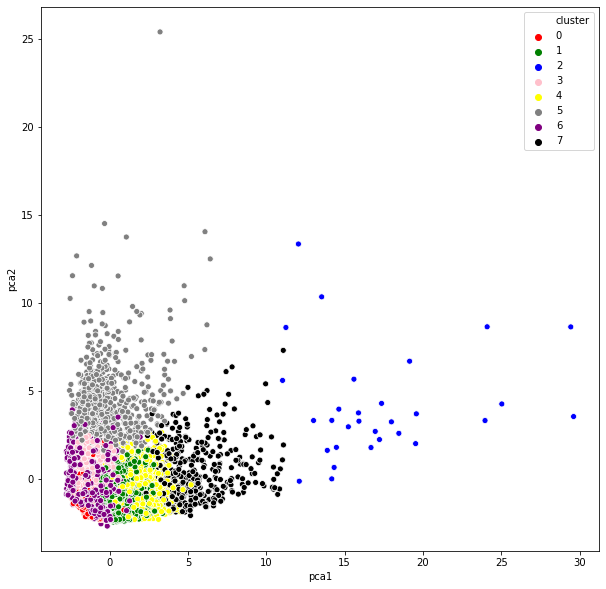

In [44]:
plt.figure(figsize = (10,10))
ax = sns.scatterplot(x = "pca1", y = "pca2", hue ="cluster", data = pca_df, 
                     palette = ["red", "green", "blue", "pink", "yellow", "grey", "purple", "black"])


### Autoencoders

In [46]:
# Use Keras API to build the model

from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from keras.optimizers import SGD 

In [47]:
# build encoder

input_df = Input(shape = (17,))

x = Dense(7, activation = "relu")(input_df) # this is the first encoding layer
x = Dense(500, activation = "relu", kernel_initializer = "glorot_uniform")(x) # this is another layer with 500 neurons and initializer = glorot_uniformt. The (x) is the previous output
x = Dense(500, activation = "relu", kernel_initializer = "glorot_uniform")(x) # this is another layer with 500 neurons and initializer = glorot_uniformt
x = Dense(2000, activation = "relu", kernel_initializer = "glorot_uniform")(x) # this is another layer with 2k neurons and initializer = glorot_uniformt
encoded = Dense(10, activation = "relu", kernel_initializer = "glorot_uniform")(x)   # build encoded layer

# now build decoded network - inverse process

x = Dense(2000, activation = "relu", kernel_initializer = "glorot_uniform")(encoded) # 1st layer of decoder
x = Dense(500, activation = "relu", kernel_initializer = "glorot_uniform")(x) # 2nd layer

decoded = Dense(17, kernel_initializer = "glorot_uniform")(x)



In [48]:
# build autoencoder

autoencoder = Model(input_df, decoded) # specify input and output

# compiling encoder
encoder = Model(input_df, encoded) # I train the autoencoder for the encoder section

autoencoder.compile(optimizer = "adam", loss = "mean_squared_error")


autoencoder.fit(df_sc, df_sc, batch_size = 128, epochs = 25, verbose = 1)

Epoch 1/25
70/70 [==============================] - 2s 32ms/step - loss: 0.5394
Epoch 2/25
70/70 [==============================] - 2s 34ms/step - loss: 0.2994
Epoch 3/25
70/70 [==============================] - 2s 34ms/step - loss: 0.2432
Epoch 4/25
70/70 [==============================] - 2s 34ms/step - loss: 0.2055
Epoch 5/25
70/70 [==============================] - 2s 33ms/step - loss: 0.1751
Epoch 6/25
70/70 [==============================] - 2s 32ms/step - loss: 0.1620
Epoch 7/25
70/70 [==============================] - 2s 33ms/step - loss: 0.1453
Epoch 8/25
70/70 [==============================] - 2s 33ms/step - loss: 0.1446
Epoch 9/25
70/70 [==============================] - 2s 34ms/step - loss: 0.1202
Epoch 10/25
70/70 [==============================] - 2s 34ms/step - loss: 0.1189
Epoch 11/25
70/70 [==============================] - 2s 33ms/step - loss: 0.1082
Epoch 12/25
70/70 [==============================] - 2s 33ms/step - loss: 0.1109
Epoch 13/25
70/70 [==================

In [50]:
# check out the autoencoder
autoencoder.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 17)]              0         
_________________________________________________________________
dense (Dense)                (None, 7)                 126       
_________________________________________________________________
dense_1 (Dense)              (None, 500)               4000      
_________________________________________________________________
dense_2 (Dense)              (None, 500)               250500    
_________________________________________________________________
dense_3 (Dense)              (None, 2000)              1002000   
_________________________________________________________________
dense_4 (Dense)              (None, 10)                20010     
_________________________________________________________________
dense_5 (Dense)              (None, 2000)             

In [53]:
# perform dimensionality reduction with autoencoders
pred = encoder.predict(df_sc)  

In [55]:
pred.shape 

(8950, 10)

In [58]:
# Optimal number of clusters

scores_2 = []

range_values = range(1, 20)

for i in range_values:
    kmeans = KMeans(n_clusters = i)
    kmeans.fit(pred) # feed the model with the predictions of the autoencoder
    scores_2.append(kmeans.inertia_)

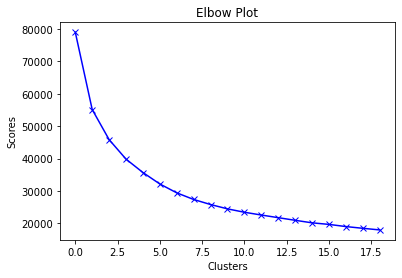

In [59]:
plt.plot(scores_2, "bx-")
plt.title("Elbow Plot")
plt.xlabel("Clusters")
plt.ylabel("Scores")
plt.show()

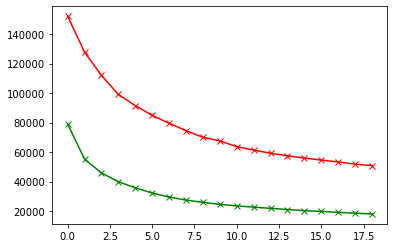

In [61]:
# Plot Elbows of 17 features and 10 features
plt.plot(score_1, "bx-", color = "r")
plt.plot(scores_2, "bx-", color = "g")

In [ ]:
# let's pick K = 4

In [62]:
# Apply k-means

kmeans = KMeans(4)
kmeans.fit(pred)
labels = kmeans.labels_


In [63]:
# concat labels to df
df_cluster_dr = pd.concat([df, pd.DataFrame({"Cluster":labels})], axis = 1)
df_cluster_dr.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,3
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12,0
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0


In [64]:
# Apply PCA
pca = PCA(n_components = 2)
principal_comp = pca.fit_transform(pred) # applied to the output of the autoencoders

In [69]:
principal_comp 

array([[-1.6860206 , -0.27478194],
       [ 2.0027616 , -1.5012491 ],
       [-0.7541032 ,  0.41208962],
       ...,
       [ 0.78226745,  0.6100275 ],
       [ 0.95044225, -0.2674148 ],
       [ 1.9187182 ,  0.67050487]], dtype=float32)

In [66]:
pca_df = pd.DataFrame(data = principal_comp, columns = ["pca1", "pca2"]) 

In [67]:
pca_df = pd.concat([pca_df, pd.DataFrame({"cluster":labels})], axis = 1) 
pca_df.head()

,pca1,pca2,cluster
0,-1.686021,-0.274782,0
1,2.002762,-1.501249,3
2,-0.754103,0.412090,0
3,-2.047802,-0.073324,0
4,-1.551840,-0.429764,0


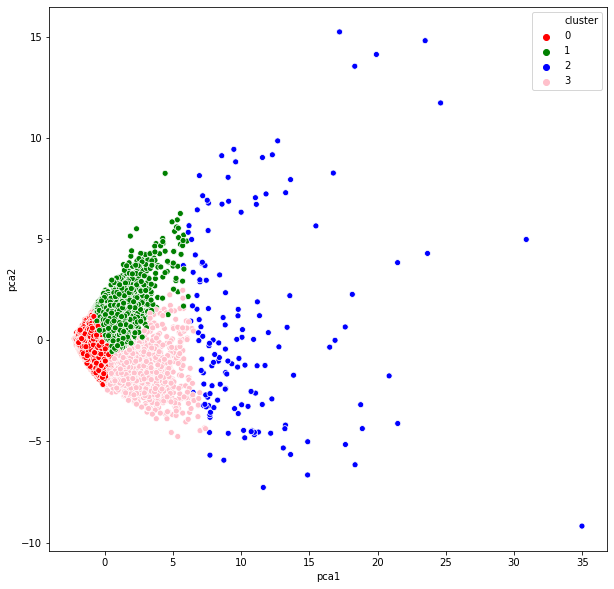

In [70]:
# visualize PCA output

plt.figure(figsize = (10,10))
ax = sns.scatterplot(x = "pca1", y = "pca2", hue = "cluster", data = pca_df, palette = ["red", "green", "blue", "pink"])